<a href="https://colab.research.google.com/github/hyojun-rtdata/deep_fire/blob/main/train.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pwd

/content


In [2]:
!ls

cnn_layer.py  copy_utils.py  draw_box.py       sample_data
config.py     detect.py      preprocessing.py  utils.py


In [3]:
import os.path
import shutil
from google.colab import drive

if not os.path.exists('/content/gdrive'):
  drive.mount('/content/gdrive',force_remount=True)

Mounted at /content/gdrive


In [4]:
DOWNLOAD_LOCATION_IMG = '/content/'
DRIVE_DATASET_FILE_IMG = '/content/gdrive/MyDrive/fire_data/images.zip'

DOWNLOAD_LOCATION_ANN = '/content/'
DRIVE_DATASET_FILE_ANN = '/content/gdrive/MyDrive/fire_data/annotations.zip'

DOWNLOAD_LOCATION_TEST = '/content/'
DRIVE_DATASET_FILE_TEST = '/content/gdrive/MyDrive/fire_data/test_image_drone.zip'

In [5]:
shutil.copy(DRIVE_DATASET_FILE_IMG, DOWNLOAD_LOCATION_IMG)
shutil.copy(DRIVE_DATASET_FILE_ANN, DOWNLOAD_LOCATION_ANN)
shutil.copy(DRIVE_DATASET_FILE_TEST, DOWNLOAD_LOCATION_TEST)

print('Successfully downloaded the dataset')

Successfully downloaded the dataset


In [6]:
# shutil.copy(DRIVE_DATASET_FILE_TEST, DOWNLOAD_LOCATION_TEST)

In [7]:
# !unzip /content//test_image_drone.zip -d test_image_drone/ 

In [8]:
!wget https://pjreddie.com/media/files/yolov2.weights

--2021-06-23 01:24:20--  https://pjreddie.com/media/files/yolov2.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 203934260 (194M) [application/octet-stream]
Saving to: ‘yolov2.weights’

yolov2.weights      100%[===================>] 194.49M  29.5MB/s    in 12s     

2021-06-23 01:24:32 (16.0 MB/s) - ‘yolov2.weights’ saved [203934260/203934260]



In [9]:
# !mv yolov2.weights 

In [10]:
!unzip /content/images.zip -d images/ 
!unzip /content/annotations.zip -d annotations/ 
!unzip /content/test_image_drone.zip -d test_image_drone/ 

Archive:  /content/images.zip
   creating: images/images/
  inflating: images/images/firet_0.jpg  
 extracting: images/images/firet_1.jpg  
  inflating: images/images/firet_10.jpg  
  inflating: images/images/firet_100.jpg  
  inflating: images/images/firet_1000.jpg  
  inflating: images/images/firet_1001.jpg  
  inflating: images/images/firet_1002.jpg  
  inflating: images/images/firet_1003.jpg  
  inflating: images/images/firet_1004.jpg  
  inflating: images/images/firet_1005.jpg  
  inflating: images/images/firet_1006.jpg  
  inflating: images/images/firet_1007.jpg  
  inflating: images/images/firet_1008.jpg  
  inflating: images/images/firet_1009.jpg  
  inflating: images/images/firet_101.jpg  
  inflating: images/images/firet_1010.jpg  
  inflating: images/images/firet_1011.jpg  
  inflating: images/images/firet_1012.jpg  
  inflating: images/images/firet_1013.jpg  
  inflating: images/images/firet_1014.jpg  
  inflating: images/images/firet_1015.jpg  
  inflating: images/images/f

Data Preprocessing

In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import SGD, Adam, RMSprop
import numpy as np

import config # import config file for initial settings
from cnn_layer import cnn_network #import cnn_layer to create model
from utils import WeightReader, normalize # import weight reader utils
from preprocessing import parse_annotation, SimpleBatchGenerator #import parse_annotation to prepare training data

In [2]:
# %cd annotations/annotations/

In [3]:

# %rm fm51696.xml


In [4]:
# %rm fm51698.xml
# % cd ..

In [5]:
# Read and parse training data
train_image, seen_train_labels = parse_annotation(config.train_annot_folder, config.train_image_folder, labels=config.LABELS)
print(train_image[0])
print(seen_train_labels)
print("N train = {}".format(len(train_image)))

{'object': [{'name': 'fire', 'xmin': 949, 'ymin': 941, 'xmax': 1022, 'ymax': 992}, {'name': 'fire', 'xmin': 1097, 'ymin': 731, 'xmax': 1316, 'ymax': 844}, {'name': 'fire', 'xmin': 1347, 'ymin': 627, 'xmax': 1499, 'ymax': 719}], 'filename': '/content/images/images/firet_0.jpg', 'width': 1920, 'height': 1080}
{'fire': 8130}
N train = 1654


In [6]:
# Training Model

In [7]:
# Read pretrained yolo weight
weight_reader = WeightReader(config.path_to_weight)
print("all_weights.shape = {}".format(weight_reader.all_weights.shape))

all_weights.shape = (50983565,)


In [8]:
# create cnn model for yolo
model = cnn_network()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 416, 416, 3) 0                                            
__________________________________________________________________________________________________
conv_1 (Conv2D)                 (None, 416, 416, 32) 864         input_2[0][0]                    
__________________________________________________________________________________________________
norm_1 (BatchNormalization)     (None, 416, 416, 32) 128         conv_1[0][0]                     
__________________________________________________________________________________________________
leaky_re_lu (LeakyReLU)         (None, 416, 416, 32) 0           norm_1[0][0]                     
______________________________________________________________________________________________

In [9]:
# reset weight
weight_reader.reset()

# set weight to cnn model
for i in range(1, config.nb_conv+1):
    conv_layer = model.get_layer('conv_' + str(i))
    
    if i < config.nb_conv:
        norm_layer = model.get_layer('norm_' + str(i))
        
        size = np.prod(norm_layer.get_weights()[0].shape)

        beta  = weight_reader.read_bytes(size)
        gamma = weight_reader.read_bytes(size)
        mean  = weight_reader.read_bytes(size)
        var   = weight_reader.read_bytes(size)

        weights = norm_layer.set_weights([gamma, beta, mean, var])       
        
    if len(conv_layer.get_weights()) > 1:
        bias   = weight_reader.read_bytes(np.prod(conv_layer.get_weights()[1].shape))
        kernel = weight_reader.read_bytes(np.prod(conv_layer.get_weights()[0].shape))
        kernel = kernel.reshape(list(reversed(conv_layer.get_weights()[0].shape)))
        kernel = kernel.transpose([2,3,1,0])
        conv_layer.set_weights([kernel, bias])
    else:
        kernel = weight_reader.read_bytes(np.prod(conv_layer.get_weights()[0].shape))
        kernel = kernel.reshape(list(reversed(conv_layer.get_weights()[0].shape)))
        kernel = kernel.transpose([2,3,1,0])
        conv_layer.set_weights([kernel])

In [10]:
# set weights to the last convolutional layer
layer   = model.layers[-4]
weights = layer.get_weights()

new_kernel = np.random.normal(size=weights[0].shape)/(config.GRID_H*config.GRID_W)
new_bias   = np.random.normal(size=weights[1].shape)/(config.GRID_H*config.GRID_W)

layer.set_weights([new_kernel, new_bias])

In [11]:
# Create batch generator
ANCHORS          =  np.array(config.ANCHORS)
ANCHORS[::2]     = ANCHORS[::2]*config.GRID_W  
ANCHORS[1::2]    = ANCHORS[1::2]*config.GRID_H 

# Create batch generator
generator_config = {
    'IMAGE_H'         : config.IMAGE_H, 
    'IMAGE_W'         : config.IMAGE_W,
    'GRID_H'          : config.GRID_H,  
    'GRID_W'          : config.GRID_W,
    'BOX'             : config.BOX,
    'LABELS'          : config.LABELS,
    'ANCHORS'         : ANCHORS,
    'BATCH_SIZE'      : config.BATCH_SIZE,
    'TRUE_BOX_BUFFER' : config.TRUE_BOX_BUFFER,
}

train_batch_generator = SimpleBatchGenerator(train_image, generator_config, norm=normalize)
[x_batch,b_batch],y_batch = train_batch_generator.__getitem__(idx=3)

In [12]:
from utils import get_cell_grid, adjust_scale_prediction
def print_min_max(vec,title):
    try:
        print("{} MIN={:5.2f}, MAX={:5.2f}".format(title,np.min(vec),np.max(vec)))
    except ValueError:  #raised if `y` is empty.
        pass

In [13]:
size   = config.BATCH_SIZE*config.GRID_W*config.GRID_H*config.BOX*(4 + 1 + config.CLASS)
y_pred = np.random.normal(size=size,scale = 10/(config.GRID_H*config.GRID_W)) 
y_pred = y_pred.reshape(config.BATCH_SIZE,config.GRID_H,config.GRID_W,config.BOX,4 + 1 + config.CLASS)
print("y_pred before scaling = {}".format(y_pred.shape))

print("*"*30)
print("define tensor graph")
y_pred_tf = tf.constant(y_pred,dtype="float32")
cell_grid = get_cell_grid(config.GRID_W,config.GRID_H,config.BATCH_SIZE,config.BOX)
(pred_box_xy,   pred_box_wh, pred_box_conf, pred_box_class) = adjust_scale_prediction(y_pred_tf, 
                                                                cell_grid, 
                                                                ANCHORS)
print("*"*30 + "\nouput\n" + "*"*30) 

print("\npred_box_xy {}".format(pred_box_xy.shape)) 
print("\npred_box_conf {}".format(pred_box_conf.shape))
print("\npred_box_class {}".format(pred_box_class.shape))

y_pred before scaling = (16, 13, 13, 4, 6)
******************************
define tensor graph
******************************
ouput
******************************

pred_box_xy (16, 13, 13, 4, 2)

pred_box_conf (16, 13, 13, 4)

pred_box_class (16, 13, 13, 4, 1)


In [14]:
from utils import extract_ground_truth
# y_batch is the output of the simpleBatchGenerator.fit()
print("Input y_batch = {}".format(y_batch.shape))

y_batch_tf = tf.constant(y_batch,dtype="float32")
(true_box_xy, true_box_wh, 
        true_box_conf, true_box_class) = extract_ground_truth(y_batch_tf)

print("\ntrue_box_wh {}".format(true_box_wh.shape))
print_min_max(true_box_wh[:,:,:,:,0],"  bounding box width ") 
print_min_max(true_box_wh[:,:,:,:,1],"  bounding box height") 
    
print("\ntrue_box_conf {}".format(true_box_conf.shape))
print("  confidence, unique value = {}".format(np.unique(true_box_conf))) 

print("\ntrue_box_class {}".format(true_box_class.shape))
print("  class index, unique value = {}".format(np.unique(true_box_class)) )

Input y_batch = (16, 13, 13, 4, 6)

true_box_wh (16, 13, 13, 4, 2)
  bounding box width  MIN= 0.00, MAX= 3.44
  bounding box height MIN= 0.00, MAX= 4.72

true_box_conf (16, 13, 13, 4)
  confidence, unique value = [0. 1.]

true_box_class (16, 13, 13, 4)
  class index, unique value = [0]


In [15]:
from utils import calc_loss_xywh
LAMBDA_COORD = 1
loss_xywh, coord_mask  = calc_loss_xywh(true_box_conf, LAMBDA_COORD, true_box_xy, pred_box_xy,true_box_wh, pred_box_wh)

In [16]:
from utils import calc_loss_class
LAMBDA_CLASS   = 1
loss_class  = calc_loss_class(true_box_conf,LAMBDA_CLASS,
                                true_box_class,pred_box_class)
print("*"*30 + "\nouput\n" + "*"*30) 
print("loss_class = {:4.3f}".format(loss_class))

******************************
ouput
******************************
loss_class = 0.000


In [17]:
from utils import get_intersect_area
from utils import calc_IOU_pred_true_assigned

true_box_conf_IOU = calc_IOU_pred_true_assigned(
                        true_box_conf,
                        true_box_xy, true_box_wh,
                        pred_box_xy,  pred_box_wh)

print("*"*30 + "\ninput\n" + "*"*30)    
print("true_box_conf = {}".format(true_box_conf))
print("true_box_xy   = {}".format(true_box_xy))
print("true_box_wh   = {}".format(true_box_wh))
print("pred_box_xy   = {}".format(pred_box_xy))
print("pred_box_wh   = {}".format(pred_box_wh))
print("*"*30 + "\nouput\n" + "*"*30) 
print("true_box_conf_IOU.shape = {}".format(true_box_conf_IOU.shape))

******************************
input
******************************
true_box_conf = [[[[0. 0. 0. 0.]
   [0. 0. 0. 0.]
   [0. 0. 0. 0.]
   ...
   [0. 0. 0. 0.]
   [0. 0. 0. 0.]
   [0. 0. 0. 0.]]

  [[0. 0. 0. 0.]
   [0. 0. 0. 0.]
   [0. 0. 0. 0.]
   ...
   [0. 0. 0. 0.]
   [0. 0. 0. 0.]
   [0. 0. 0. 0.]]

  [[0. 0. 0. 0.]
   [0. 0. 0. 0.]
   [0. 0. 0. 0.]
   ...
   [0. 0. 0. 0.]
   [0. 0. 0. 0.]
   [0. 0. 0. 0.]]

  ...

  [[0. 0. 0. 0.]
   [0. 0. 0. 0.]
   [0. 0. 0. 0.]
   ...
   [0. 0. 0. 0.]
   [0. 0. 0. 0.]
   [0. 0. 0. 0.]]

  [[0. 0. 0. 0.]
   [0. 0. 0. 0.]
   [0. 0. 0. 0.]
   ...
   [0. 0. 0. 0.]
   [0. 0. 0. 0.]
   [0. 0. 0. 0.]]

  [[0. 0. 0. 0.]
   [0. 0. 0. 0.]
   [0. 0. 0. 0.]
   ...
   [0. 0. 0. 0.]
   [0. 0. 0. 0.]
   [0. 0. 0. 0.]]]


 [[[0. 0. 0. 0.]
   [0. 0. 0. 0.]
   [0. 0. 0. 0.]
   ...
   [0. 0. 0. 0.]
   [0. 0. 0. 0.]
   [0. 0. 0. 0.]]

  [[0. 0. 0. 0.]
   [0. 0. 0. 0.]
   [0. 0. 0. 0.]
   ...
   [0. 0. 0. 0.]
   [0. 0. 0. 0.]
   [0. 0. 0. 0.]]

  [[0. 0. 0. 0.]
  

In [18]:
from utils import calc_IOU_pred_true_best
true_boxes = tf.constant(b_batch,dtype="float32")
best_ious = calc_IOU_pred_true_best(pred_box_xy,
                                    pred_box_wh,
                                    true_boxes)
    
print("*"*30 + "\ninput\n" + "*"*30)    
print("true_box_wh   = {}".format(true_box_wh))
print("pred_box_xy   = {}".format(pred_box_xy))
print("pred_box_wh   = {}".format(pred_box_wh))
print("*"*30 + "\nouput\n" + "*"*30) 
print("best_ious.shape = {}".format(best_ious.shape))

******************************
input
******************************
true_box_wh   = [[[[[0.      0.     ]
    [0.      0.     ]
    [0.      0.     ]
    [0.      0.     ]]

   [[0.      0.     ]
    [0.      0.     ]
    [0.      0.     ]
    [0.      0.     ]]

   [[0.      0.     ]
    [0.      0.     ]
    [0.      0.     ]
    [0.      0.     ]]

   ...

   [[0.      0.     ]
    [0.      0.     ]
    [0.      0.     ]
    [0.      0.     ]]

   [[0.      0.     ]
    [0.      0.     ]
    [0.      0.     ]
    [0.      0.     ]]

   [[0.      0.     ]
    [0.      0.     ]
    [0.      0.     ]
    [0.      0.     ]]]


  [[[0.      0.     ]
    [0.      0.     ]
    [0.      0.     ]
    [0.      0.     ]]

   [[0.      0.     ]
    [0.      0.     ]
    [0.      0.     ]
    [0.      0.     ]]

   [[0.      0.     ]
    [0.      0.     ]
    [0.      0.     ]
    [0.      0.     ]]

   ...

   [[0.      0.     ]
    [0.      0.     ]
    [0.      0.     ]
    [0.      0.     ]]

In [19]:
from utils import get_conf_mask
conf_mask = get_conf_mask(best_ious, 
                            true_box_conf, 
                            true_box_conf_IOU,
                            config.LAMBDA_NO_OBJECT, 
                            config.LAMBDA_OBJECT)
print("*"*30 + "\ninput\n" + "*"*30)  
print("best_ious         = {}".format(best_ious)) 
print("true_box_conf     = {}".format(true_box_conf))
print("true_box_conf_IOU = {}".format(true_box_conf_IOU))
print("LAMBDA_NO_OBJECT  = {}".format(config.LAMBDA_NO_OBJECT)) 
print("LAMBDA_OBJECT     = {}".format(config.LAMBDA_OBJECT))

******************************
input
******************************
best_ious         = [[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 

In [20]:
from utils import calc_loss_conf
print("*"*30 + "\ninput\n" + "*"*30)  
print("conf_mask         = {}".format(conf_mask)) 
print("true_box_conf_IOU = {}".format(true_box_conf_IOU))
print("pred_box_conf     = {}".format(pred_box_conf))

loss_conf = calc_loss_conf(conf_mask,true_box_conf_IOU, pred_box_conf)
    
print("*"*30 + "\noutput\n" + "*"*30)      
print("loss_conf = {:5.4f}".format(loss_conf))

******************************
input
******************************
conf_mask         = [[[[1.         1.         1.         1.        ]
   [1.         1.         1.         1.        ]
   [1.         1.         1.         1.        ]
   ...
   [1.         1.         1.         1.        ]
   [1.         1.         1.         1.        ]
   [1.         1.         1.         1.        ]]

  [[1.         1.         1.         1.        ]
   [1.         1.         1.         1.        ]
   [1.         1.         1.         1.        ]
   ...
   [1.         1.         1.         1.        ]
   [1.         1.         1.         1.        ]
   [1.         1.         1.         1.        ]]

  [[1.         1.         1.         1.        ]
   [1.         1.         1.         1.        ]
   [1.         1.         1.         1.        ]
   ...
   [1.         1.         1.         1.        ]
   [1.         1.         1.         1.        ]
   [1.         1.         1.         1.        ]]

  .

In [21]:
def custom_loss(y_true, y_pred):
    '''
    y_true : (N batch, N grid h, N grid w, N anchor, 4 + 1 + N classes)
    y_true[irow, i_gridh, i_gridw, i_anchor, :4] = center_x, center_y, w, h
    
        center_x : The x coordinate center of the bounding box.
                Rescaled to range between 0 and N gird  w (e.g., ranging between [0,13)
        center_y : The y coordinate center of the bounding box.
                Rescaled to range between 0 and N gird  h (e.g., ranging between [0,13)
        w        : The width of the bounding box.
                Rescaled to range between 0 and N gird  w (e.g., ranging between [0,13)
        h        : The height of the bounding box.
                Rescaled to range between 0 and N gird  h (e.g., ranging between [0,13)
                
    y_true[irow, i_gridh, i_gridw, i_anchor, 4] = ground truth confidence
        
        ground truth confidence is 1 if object exists in this (anchor box, gird cell) pair
    
    y_true[irow, i_gridh, i_gridw, i_anchor, 5 + iclass] = 1 if the object is in category  else 0
        
    '''
    total_recall = tf.Variable(0.)
    
    # Step 1: Adjust prediction output
    cell_grid   = get_cell_grid(config.GRID_W,config.GRID_H,config.BATCH_SIZE,config.BOX)
    pred_box_xy, pred_box_wh, pred_box_conf, pred_box_class = adjust_scale_prediction(y_pred,cell_grid,ANCHORS)
    # Step 2: Extract ground truth output
    true_box_xy, true_box_wh, true_box_conf, true_box_class = extract_ground_truth(y_true)
    # Step 3: Calculate loss for the bounding box parameters
    loss_xywh, coord_mask = calc_loss_xywh(true_box_conf,config.LAMBDA_COORD,
                                        true_box_xy, pred_box_xy,true_box_wh,pred_box_wh)
    # Step 4: Calculate loss for the class probabilities
    loss_class  = calc_loss_class(true_box_conf,config.LAMBDA_CLASS,
                                true_box_class,pred_box_class)
    # Step 5: For each (grid cell, anchor) pair, 
    #         calculate the IoU between predicted and ground truth bounding box
    true_box_conf_IOU = calc_IOU_pred_true_assigned(true_box_conf,
                                                    true_box_xy, true_box_wh,
                                                    pred_box_xy, pred_box_wh)
    # Step 6: For each predicted bounded box from (grid cell, anchor box), 
    #         calculate the best IOU, regardless of the ground truth anchor box that each object gets assigned.
    best_ious = calc_IOU_pred_true_best(pred_box_xy,pred_box_wh,true_boxes)
    # Step 7: For each grid cell, calculate the L_{i,j}^{noobj}
    conf_mask = get_conf_mask(best_ious, true_box_conf, true_box_conf_IOU,config.LAMBDA_NO_OBJECT, config.LAMBDA_OBJECT)
    # Step 8: Calculate loss for the confidence
    loss_conf = calc_loss_conf(conf_mask,true_box_conf_IOU, pred_box_conf)

    
    loss = loss_xywh + loss_conf + loss_class
    

    
    return loss

print(y_batch.dtype, y_pred.dtype)
true_boxes = tf.Variable(np.zeros_like(b_batch), dtype="float32")
loss = custom_loss(y_batch.astype('float32'), y_pred.astype('float32')) 
print('loss', loss)

print(y_batch.dtype, y_pred.dtype)
true_boxes = tf.Variable(np.zeros_like(b_batch), dtype="float32")
loss = custom_loss(y_batch.astype('float32'), y_pred.astype('float32')) 
print('loss', loss)

float64 float64
loss tf.Tensor(0.39411038, shape=(), dtype=float32)
float64 float64
loss tf.Tensor(0.39411038, shape=(), dtype=float32)


In [22]:
# Compile the model
early_stop = EarlyStopping(monitor='loss', 
                           min_delta=0.001, 
                           patience=3, 
                           mode='min', 
                           verbose=1)

checkpoint = ModelCheckpoint(config.path_to_save_weight, 
                             monitor='loss', 
                             verbose=1, 
                             save_best_only=True, 
                             mode='min', 
                             period=1)

optimizer = Adam(lr=0.5e-4, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0)
model.compile(loss=custom_loss ,optimizer=optimizer)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


In [23]:
# Train the model
tf.config.experimental_run_functions_eagerly(True)

model.fit_generator(generator        = train_batch_generator, 
                    steps_per_epoch  = len(train_batch_generator), 
                    epochs           = 35, 
                    verbose          = 1,
                    callbacks        = [early_stop, checkpoint], 
                    max_queue_size   = 3)

Instructions for updating:
Use `tf.config.run_functions_eagerly` instead of the experimental version.


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1940: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '
/usr/local/lib/python3.7/dist-packages/tensorflow/python/data/ops/dataset_ops.py:3704: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable.debug_mode()`.
  "Even though the `tf.config.experimental_run_functions_eagerly` "


Epoch 1/35
104/104 [==============================] - 87s 780ms/step - loss: 0.3810

Epoch 00001: loss improved from inf to 0.38096, saving model to /content/weights_yolo_on_drone.h5
Epoch 2/35
104/104 [==============================] - 81s 778ms/step - loss: 0.2084

Epoch 00002: loss improved from 0.38096 to 0.20841, saving model to /content/weights_yolo_on_drone.h5
Epoch 3/35
104/104 [==============================] - 82s 784ms/step - loss: 0.1822

Epoch 00003: loss improved from 0.20841 to 0.18221, saving model to /content/weights_yolo_on_drone.h5
Epoch 4/35
104/104 [==============================] - 84s 801ms/step - loss: 0.1442

Epoch 00004: loss improved from 0.18221 to 0.14421, saving model to /content/weights_yolo_on_drone.h5
Epoch 5/35
104/104 [==============================] - 82s 781ms/step - loss: 0.1165

Epoch 00005: loss improved from 0.14421 to 0.11652, saving model to /content/weights_yolo_on_drone.h5
Epoch 6/35
104/104 [==============================] - 80s 768ms/step 

Image test

In [24]:
import os
import numpy as np
import matplotlib.pyplot as plt    # for plotting the images
%matplotlib inline

import config # import config file for initial settings
from cnn_layer import cnn_network, custom_loss #import cnn_layer to create model
from utils import ImageReader, OutputRescaler, find_high_class_probability_bbox, draw_boxes, nonmax_suppression
from detect import predict, plot

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 416, 416, 3) 0                                            
__________________________________________________________________________________________________
conv_1 (Conv2D)                 (None, 416, 416, 32) 864         input_3[0][0]                    
__________________________________________________________________________________________________
norm_1 (BatchNormalization)     (None, 416, 416, 32) 128         conv_1[0][0]                     
__________________________________________________________________________________________________
leaky_re_lu_22 (LeakyReLU)      (None, 416, 416, 32) 0           norm_1[0][0]                     
____________________________________________________________________________________________

/usr/local/lib/python3.7/dist-packages/tensorflow/python/data/ops/dataset_ops.py:3704: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable.debug_mode()`.
  "Even though the `tf.config.experimental_run_functions_eagerly` "


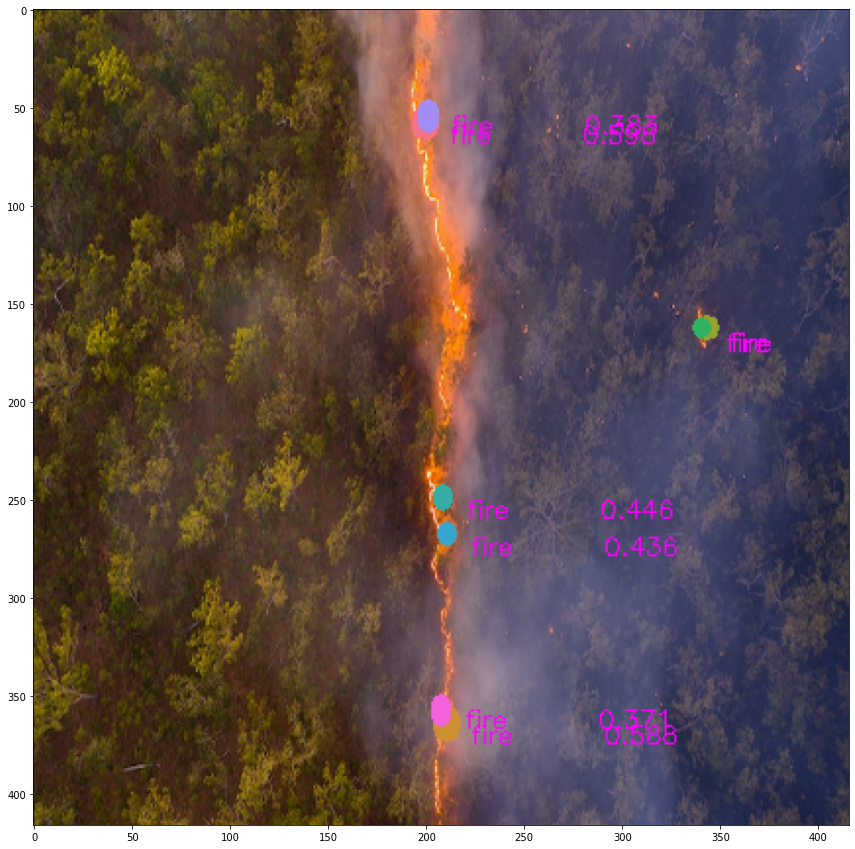

In [25]:
# Single image detection
outputRescaler = OutputRescaler(ANCHORS=config.ANCHORS)
imageReader    = ImageReader(config.IMAGE_H,IMAGE_W=config.IMAGE_W, norm=lambda image : image / 255.)
_path    = os.path.join(config.test_images_folder,"firet_592.jpg")
out      = imageReader.fit(_path)
X_test         = []
X_test.append(out)

# predict images
y_pred = predict(X_test)

# Draw boxes
for iframe in range(len(y_pred)):
        netout         = y_pred[iframe] 
        netout_scale   = outputRescaler.fit(netout)
        boxes          = find_high_class_probability_bbox(netout_scale,config.OBJ_THRESHOLD)
        if len(boxes) > 0:
            final_boxes    = nonmax_suppression(boxes,
                                                iou_threshold=config.IOU_THRESHOLD,
                                                obj_threshold=config.OBJ_THRESHOLD)
            ima = draw_boxes(X_test[iframe],final_boxes,config.LABELS,verbose=False)
            plt.figure(figsize=config.figsize)
            plt.imshow(ima); 
            plt.show()

In [26]:
# 
np.random.seed(1)
Nsample   = 10
image_nms = list(np.random.choice(os.listdir(config.test_images_folder),Nsample))

/usr/local/lib/python3.7/dist-packages/tensorflow/python/data/ops/dataset_ops.py:3704: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable.debug_mode()`.
  "Even though the `tf.config.experimental_run_functions_eagerly` "


fire       0.447 xmin= 292,ymin= 313,xmax= 296,ymax= 315
fire       0.401 xmin=  53,ymin= 297,xmax=  59,ymax= 299
fire       0.396 xmin= 212,ymin= 302,xmax= 216,ymax= 304
fire       0.385 xmin=  80,ymin= 298,xmax=  84,ymax= 300
fire       0.352 xmin=  82,ymin= 275,xmax=  86,ymax= 277
fire       0.315 xmin= 151,ymin= 303,xmax= 154,ymax= 304
fire       0.298 xmin= 117,ymin= 274,xmax= 120,ymax= 276
fire       0.291 xmin= 241,ymin= 310,xmax= 245,ymax= 312


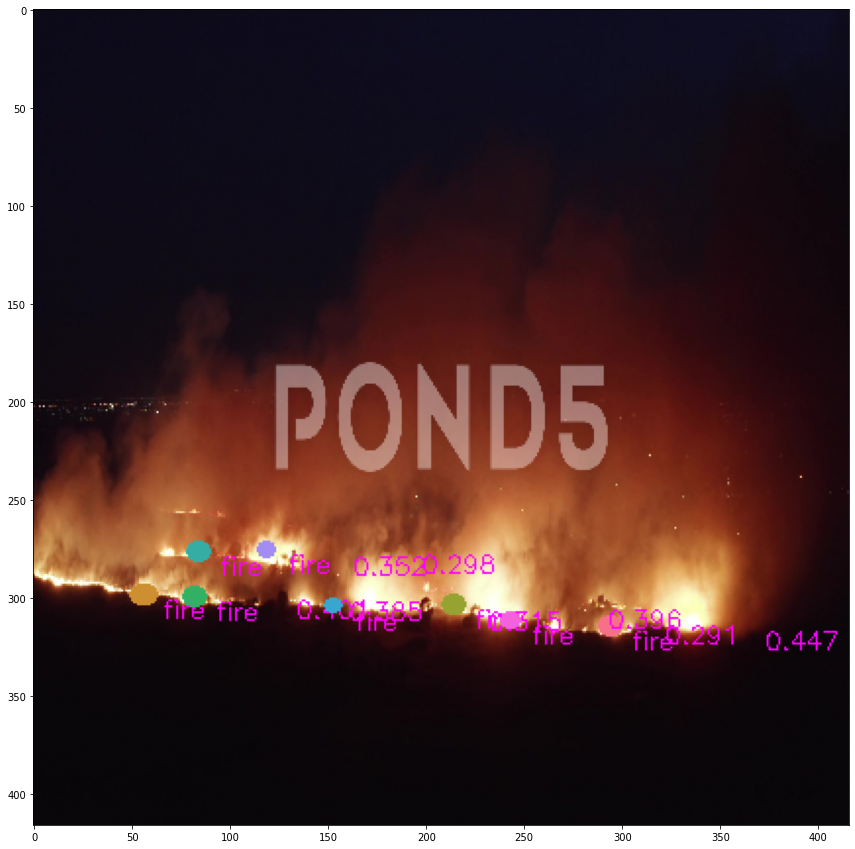

fire       0.305 xmin= 310,ymin= 171,xmax= 312,ymax= 172
fire       0.236 xmin= 335,ymin= 293,xmax= 337,ymax= 296
fire       0.233 xmin= 277,ymin= 250,xmax= 279,ymax= 252
fire       0.232 xmin= 313,ymin= 175,xmax= 314,ymax= 176
fire       0.231 xmin= 200,ymin= 172,xmax= 201,ymax= 174
fire       0.226 xmin= 203,ymin= 170,xmax= 204,ymax= 171
fire       0.211 xmin= 344,ymin= 167,xmax= 347,ymax= 169
fire       0.166 xmin=  22,ymin= 214,xmax=  24,ymax= 216


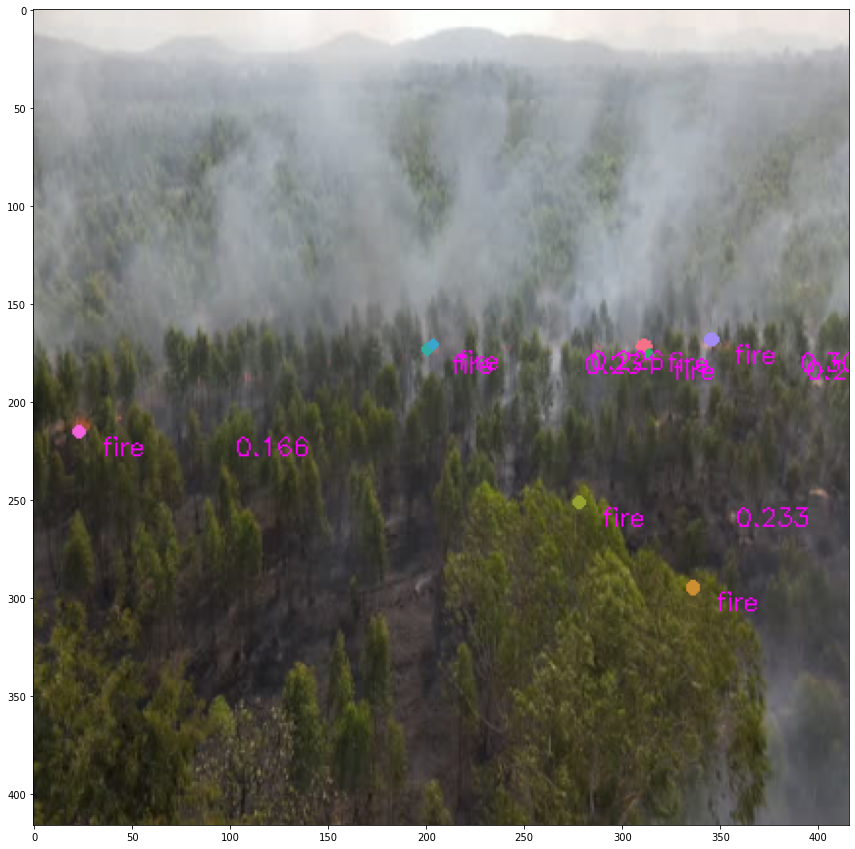

fire       0.612 xmin= 205,ymin= 129,xmax= 208,ymax= 131
fire       0.350 xmin= 301,ymin= 146,xmax= 303,ymax= 148
fire       0.322 xmin= 211,ymin= 133,xmax= 212,ymax= 133
fire       0.295 xmin= 308,ymin= 149,xmax= 309,ymax= 150
fire       0.264 xmin= 304,ymin= 217,xmax= 307,ymax= 219
fire       0.156 xmin= 322,ymin= 405,xmax= 325,ymax= 407
fire       0.153 xmin= 183,ymin= 141,xmax= 186,ymax= 143


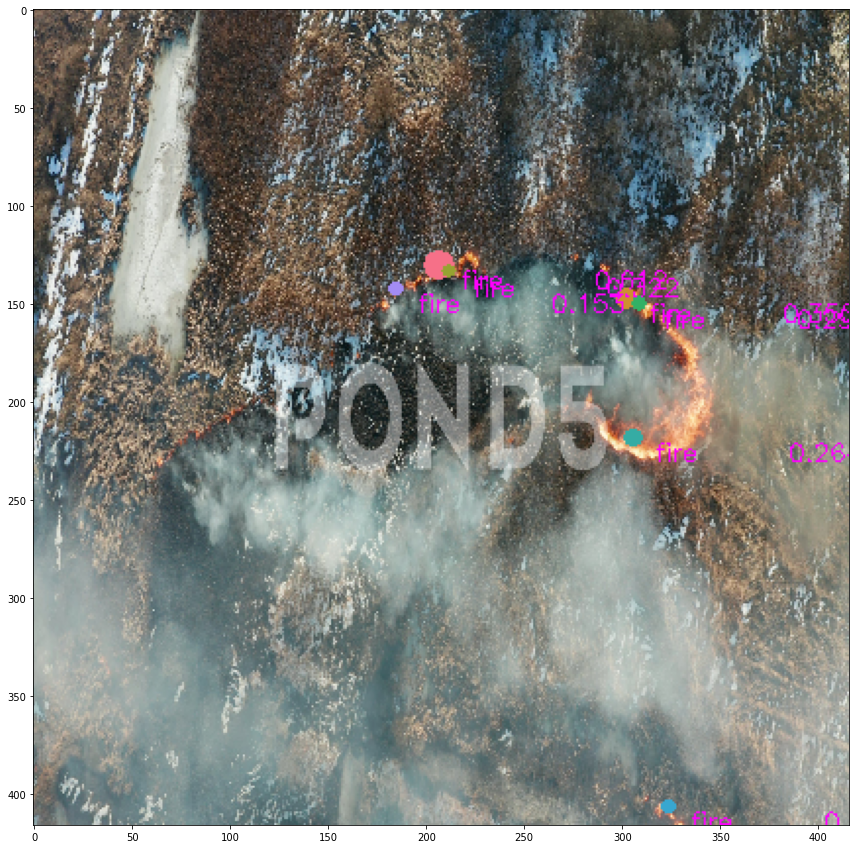

fire       0.599 xmin= 187,ymin= 270,xmax= 188,ymax= 273
fire       0.238 xmin= 149,ymin= 160,xmax= 151,ymax= 164
fire       0.198 xmin= 301,ymin= 304,xmax= 302,ymax= 305
fire       0.174 xmin= 295,ymin= 307,xmax= 296,ymax= 309


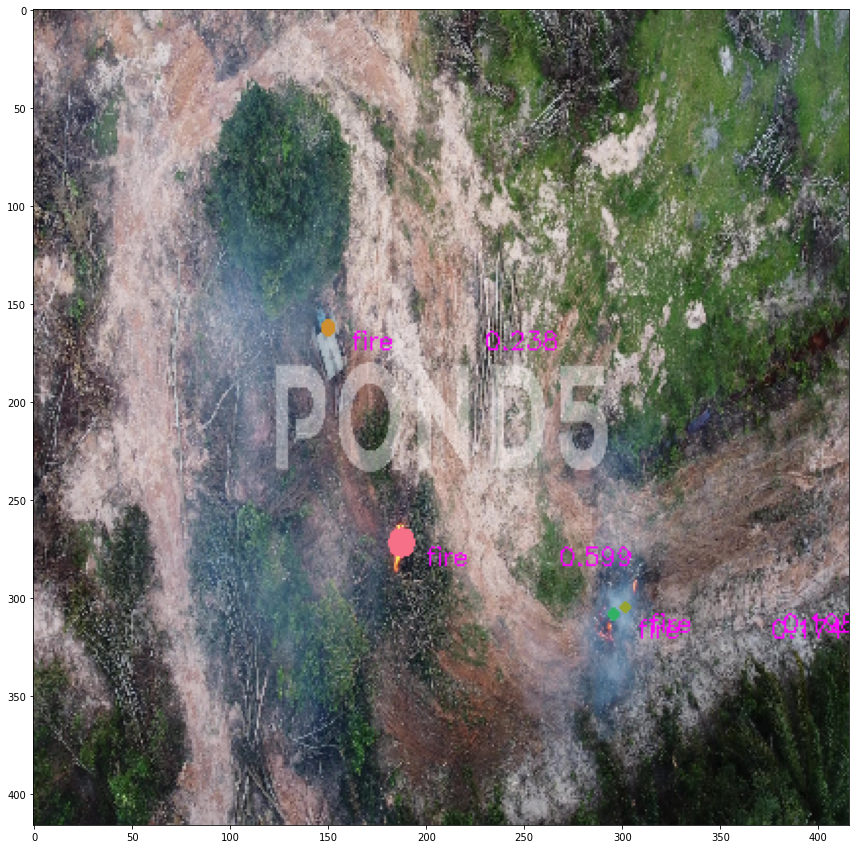

fire       0.573 xmin=  16,ymin= 341,xmax=  19,ymax= 343
fire       0.506 xmin=  19,ymin= 359,xmax=  21,ymax= 361
fire       0.381 xmin=   8,ymin= 291,xmax=   9,ymax= 293
fire       0.363 xmin= 263,ymin= 145,xmax= 268,ymax= 146
fire       0.312 xmin= 247,ymin= 149,xmax= 252,ymax= 150
fire       0.261 xmin=  17,ymin= 337,xmax=  18,ymax= 338
fire       0.232 xmin=  22,ymin= 363,xmax=  23,ymax= 364
fire       0.217 xmin= 205,ymin= 118,xmax= 207,ymax= 120


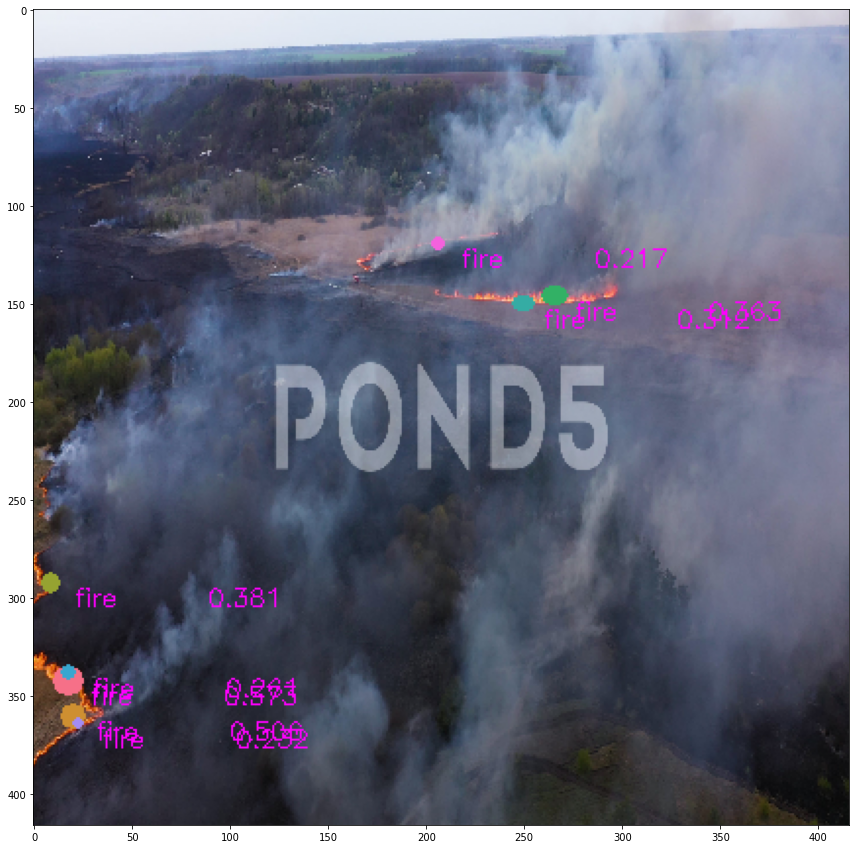

fire       0.269 xmin= 284,ymin= 129,xmax= 285,ymax= 132
fire       0.243 xmin= 291,ymin= 135,xmax= 292,ymax= 138
fire       0.210 xmin= 277,ymin= 116,xmax= 279,ymax= 119


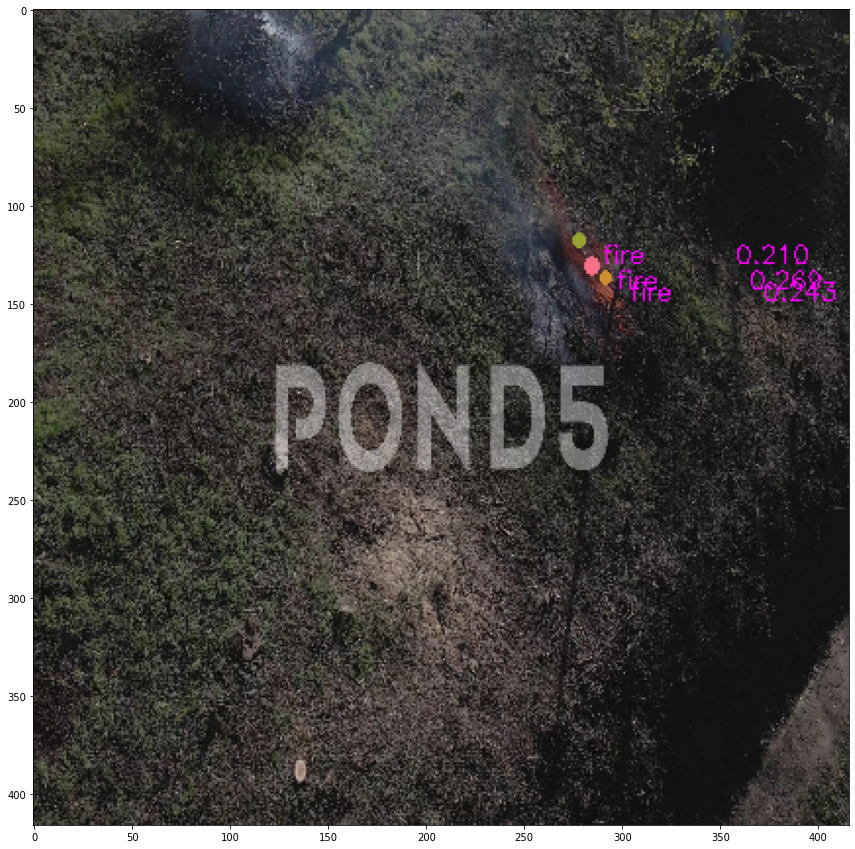

fire       0.415 xmin=  78,ymin= 175,xmax=  78,ymax= 176
fire       0.384 xmin=  77,ymin= 176,xmax=  79,ymax= 180
fire       0.348 xmin= 243,ymin= 270,xmax= 245,ymax= 273
fire       0.304 xmin= 246,ymin= 271,xmax= 246,ymax= 272
fire       0.272 xmin= 114,ymin= 219,xmax= 115,ymax= 220
fire       0.257 xmin= 146,ymin= 274,xmax= 147,ymax= 276
fire       0.251 xmin= 113,ymin= 216,xmax= 114,ymax= 219
fire       0.233 xmin= 116,ymin= 226,xmax= 117,ymax= 229


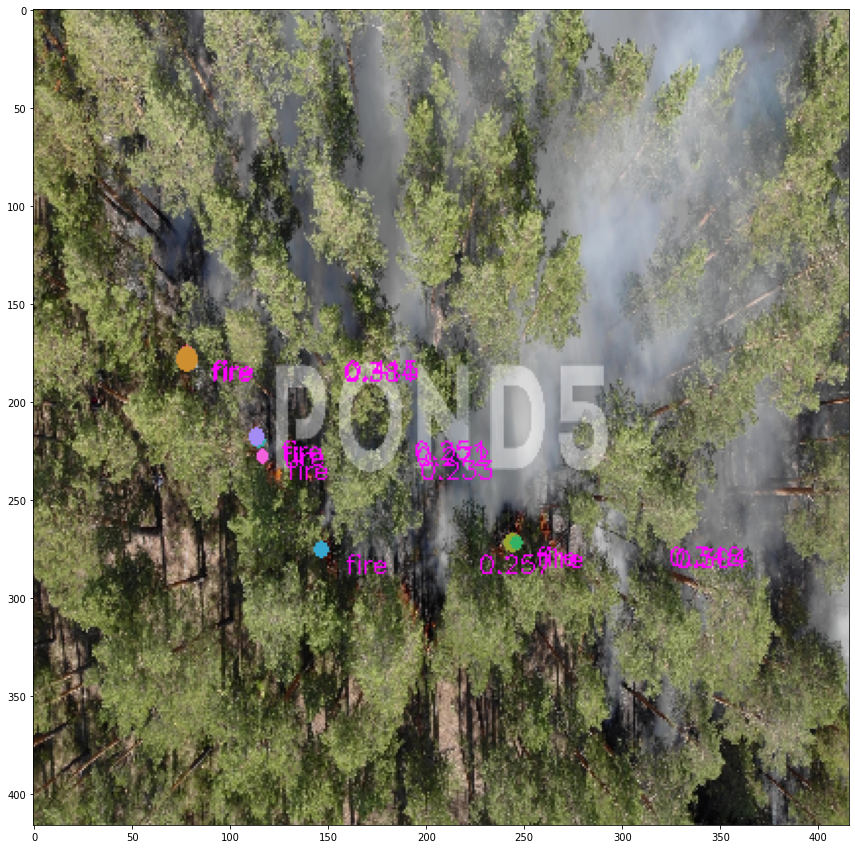

fire       0.213 xmin= 229,ymin= 195,xmax= 230,ymax= 198
fire       0.186 xmin= 228,ymin= 196,xmax= 228,ymax= 198
fire       0.178 xmin= 235,ymin= 365,xmax= 237,ymax= 367


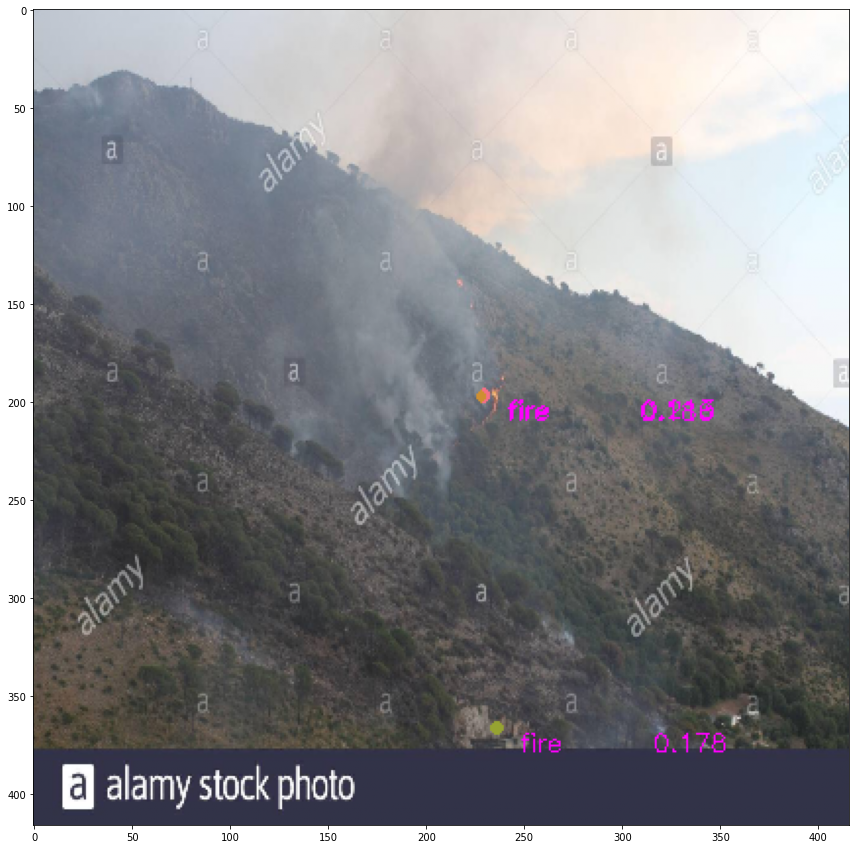

fire       0.724 xmin= 289,ymin= 259,xmax= 290,ymax= 261
fire       0.462 xmin= 283,ymin= 257,xmax= 286,ymax= 259
fire       0.394 xmin= 290,ymin= 261,xmax= 291,ymax= 263
fire       0.223 xmin= 276,ymin= 259,xmax= 277,ymax= 260
fire       0.212 xmin=  22,ymin= 120,xmax=  24,ymax= 122
fire       0.211 xmin= 206,ymin= 246,xmax= 207,ymax= 246
fire       0.203 xmin= 211,ymin= 246,xmax= 214,ymax= 247
fire       0.187 xmin= 181,ymin= 242,xmax= 182,ymax= 243


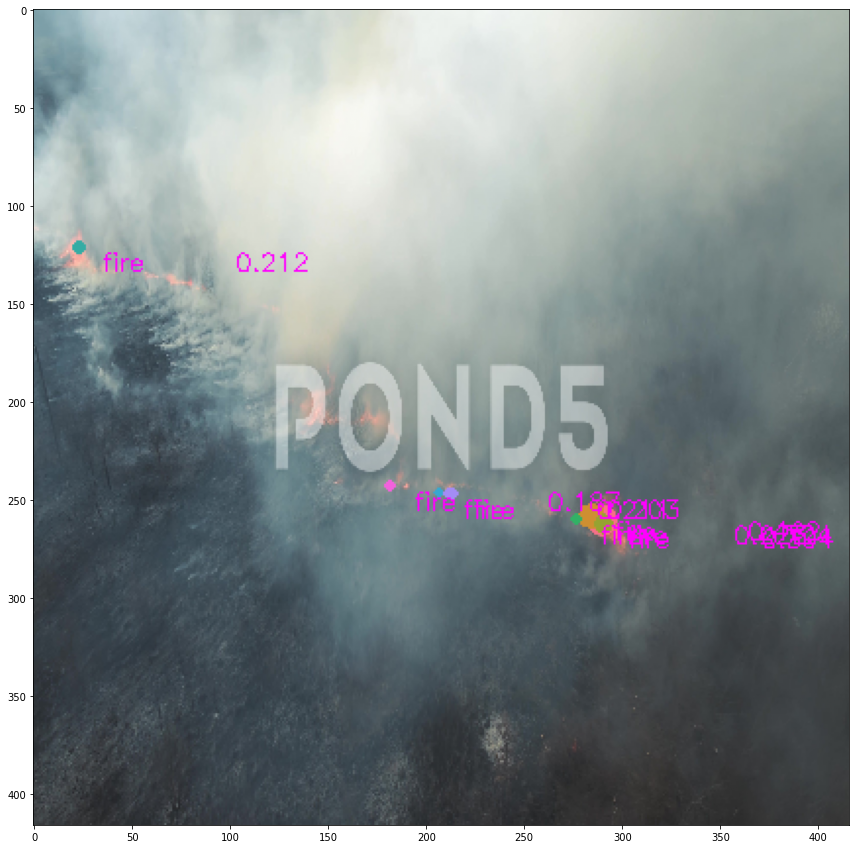

fire       0.466 xmin= 261,ymin= 367,xmax= 262,ymax= 369
fire       0.449 xmin= 295,ymin= 386,xmax= 297,ymax= 389
fire       0.412 xmin= 262,ymin= 298,xmax= 263,ymax= 304
fire       0.310 xmin= 135,ymin=  98,xmax= 137,ymax= 100
fire       0.274 xmin= 228,ymin= 139,xmax= 229,ymax= 141
fire       0.253 xmin= 167,ymin= 118,xmax= 168,ymax= 121
fire       0.238 xmin= 268,ymin= 370,xmax= 269,ymax= 372
fire       0.204 xmin= 138,ymin= 109,xmax= 142,ymax= 115


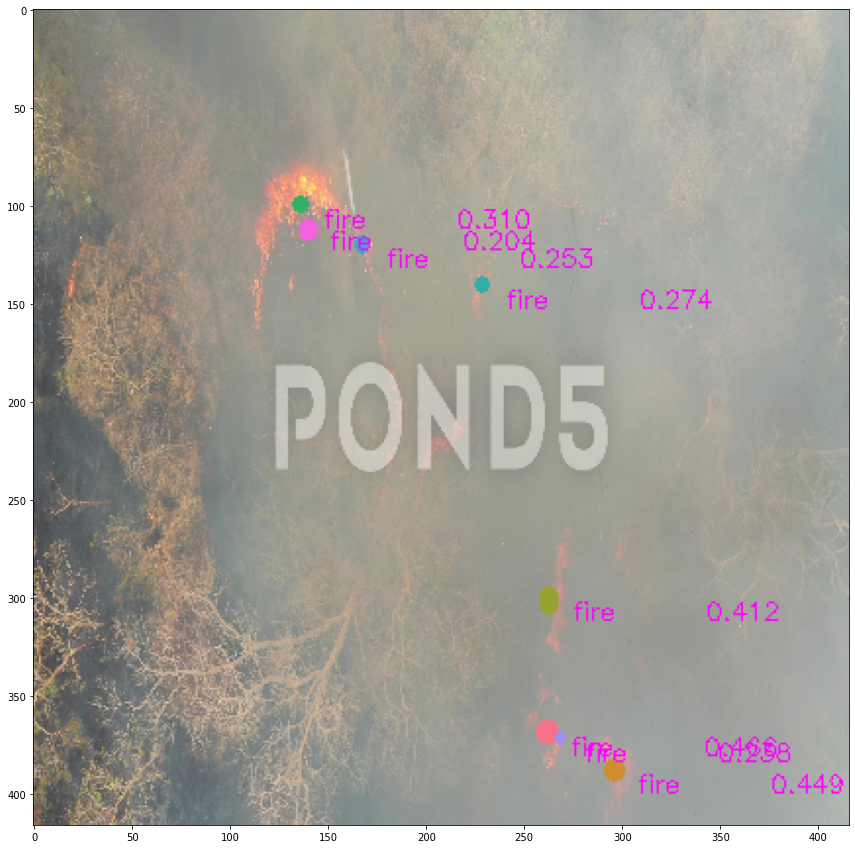

In [27]:
outputRescaler = OutputRescaler(ANCHORS=config.ANCHORS)
imageReader    = ImageReader(config.IMAGE_H,IMAGE_W=config.IMAGE_W, norm=lambda image : image / 255.)
X_test         = []
for img_nm in image_nms:
    _path    = os.path.join(config.test_images_folder,img_nm)
    out      = imageReader.fit(_path)
    X_test.append(out)

# predict images
y_pred = predict(X_test)
figsize=(15,15)

# Plot images with predicted boxes on image
# Draw boxes
for iframe in range(len(y_pred)):
        netout         = y_pred[iframe] 
        netout_scale   = outputRescaler.fit(netout)
        boxes          = find_high_class_probability_bbox(netout_scale,config.OBJ_THRESHOLD)
        if len(boxes) > 0:
            final_boxes    = nonmax_suppression(boxes,
                                                iou_threshold=config.IOU_THRESHOLD,
                                                obj_threshold=config.OBJ_THRESHOLD)
            ima = draw_boxes(X_test[iframe],final_boxes,config.LABELS,verbose=True)
            plt.figure(figsize=figsize)
            plt.imshow(ima); 
            plt.show()